In [74]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from scipy import signal
from matplotlib import animation, rc
from IPython.display import HTML
import os

%matplotlib inline

In [17]:
#!pip3 install -r requirements.txt

In [18]:
def PlotMask(image,mask):
    data_masked = np.ma.masked_where(mask == 0, mask)
    plt.imshow(image,cmap='gray')
    plt.imshow(data_masked,interpolation = 'none', vmin=0, alpha=0.8)
    plt.show()

In [19]:
def MatPlot(image):
    plt.imshow(image, cmap='gray')
    plt.show()

In [20]:
def create_video(orig_image,masked_image,shape_properties,cut=0):
    fig, ax = plt.subplots()
    plt.close()
    def animator(N): # N is the animation frame number
        ax.imshow(orig_image[:,:,cut,N], cmap='gray') # I would add interpolation='none'
        data_masked = np.ma.masked_where(masked_image[:,:,cut,N] == 0, masked_image[:,:,cut,N])
        ax.imshow(data_masked,interpolation = 'none', vmin=0, alpha=0.8)
        ax.set_title('W='+str(shape_properties[cut,N,0])+
                     ';H='+str(shape_properties[cut,N,1])+
                     ';A='+str(shape_properties[cut,N,2]))
        return ax
    PlotFrames = range(0,masked_image.shape[3],1)
    anim = animation.FuncAnimation(fig,animator,frames=PlotFrames,interval=100)
    rc('animation', html='jshtml') # embed in the HTML for Google Colab
    return anim

In [157]:
def segment_left_ventricle(image_path, seg_image_path, label=1):
    
    nim = nib.load(image_path)
    image = nim.get_fdata()
    seg_nim = nib.load(seg_image_path)
    seg_image = seg_nim.get_fdata()
    pixdim = nim.header['pixdim'][1:4] 
    
    # for loop here
    label=1
    masked_image = np.zeros_like(image)
    shape_properties = np.zeros((image.shape[2],image.shape[3],3))
    for cut in range(image.shape[2]):
        for frame_id in range(image.shape[3]):
            frame = image[:,:,cut,frame_id]
            seg_frame = seg_image[:,:,cut,frame_id]
            img =  (frame) * (seg_frame==label)
            img = img/np.max(img)
            imgray = (255*img).astype(np.uint8)
            contours, hierarchy = cv2.findContours(imgray, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
            mask=np.zeros(img.shape)
            cont = contours[0]
            rect = cv2.minAreaRect(cont)
            box = cv2.boxPoints(rect)
            box = np.int0(box)
            cv2.drawContours(mask,[box], 0,(255,0,0),2)
            _,(width,height),angle = rect
            masked_image[:,:,cut,frame_id] = mask
            shape_properties[cut,frame_id,0] = width
            shape_properties[cut,frame_id,1] = height
            shape_properties[cut,frame_id,2] = angle
    shape_properties[:,:,0:2] *= pixdim[0]
    return image,masked_image,shape_properties

In [39]:
%ls

LeftVentricleShape.ipynb  Traits.ipynb         __pycache__/      utils.py
PapillaryMuscle.ipynb     WallThickness.ipynb  demo_image/
PositionPapillary.png     WallThickness.png    requirements.txt


In [63]:
cnt=0
for d in os.listdir("data"):
    cnt+=1
    print(d)
    if(cnt==5):
        break

1000012
1000158
1000243
1000262
1000369


In [70]:
%ls

LeftVentricleShape.ipynb  Traits.ipynb         demo_image/
MeanPapillaryMass.csv     WallThickness.ipynb  environment.yml
MitralValve.ipynb         WallThickness.png    iterate.py
PapillaryMuscle.ipynb     __pycache__/         requirements.txt
PositionPapillary.png     data@                utils.py


In [160]:
for d in os.listdir("data"):
    data_dir = os.path.join("data",d)
    image_path = f"{data_dir}/la_4ch.nii.gz"
    seg_image_path = f"{data_dir}/seg4_la_4ch.nii.gz"
    print(seg_image_path)
    if os.path.exists(image_path) and os.path.exists(seg_image_path):
        orig_image, masked_image,shape_properties = segment_left_ventricle(image_path,seg_image_path)
        angle_variation = np.max(shape_properties[0,:,2])-np.min(shape_properties[0,:,2])
        break
create_video(orig_image,masked_image,shape_properties,cut=0)

data/1000012/seg4_la_4ch.nii.gz


In [161]:
image_path = "data/1013344/la_4ch.nii.gz"
seg_image_path = "data/1013344/seg4_la_4ch.nii.gz"
orig_image, masked_image,shape_properties = segment_left_ventricle(image_path,seg_image_path)
angle_variation = np.max(shape_properties[0,:,2])-np.min(shape_properties[0,:,2])
create_video(orig_image,masked_image,shape_properties,cut=0)

In [152]:
%ls /workspace/data/NAS/UKBB_NIFTI/1000012/

ES_ID.txt*         sa.nii.gz*              seg_la_4ch.nii.gz*
la_2ch.nii.gz*     sa_ED.nii.gz*           seg_la_4ch_ED.nii.gz*
la_2ch_ED.nii.gz*  sa_ES.nii.gz*           seg_la_4ch_ES.nii.gz*
la_2ch_ES.nii.gz*  seg4_la_4ch.nii.gz*     seg_sa.nii.gz*
la_3ch.nii.gz*     seg4_la_4ch_ED.nii.gz*  seg_sa_ED.nii.gz*
la_4ch.nii.gz*     seg4_la_4ch_ES.nii.gz*  seg_sa_ES.nii.gz*
la_4ch_ED.nii.gz*  seg_la_2ch.nii.gz*      wall_thickness_ED.csv*
la_4ch_ES.nii.gz*  seg_la_2ch_ED.nii.gz*   wall_thickness_ED.vtk*
lvot.nii.gz*       seg_la_2ch_ES.nii.gz*   wall_thickness_ED_max.csv*


In [154]:
real_path = "/workspace/data/NAS/UKBB_NIFTI/6023555/seg4_la_4ch.nii.gz"

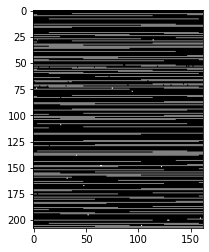

In [155]:
#seg_nim = nib.load('../UKBB-CMR/ukbb_cardiac/demo_image/1003167/seg4_la_4ch.nii.gz')
seg_nim = nib.load(real_path)
seg_image = seg_nim.get_fdata()
seg_frame = seg_image[:,:,0,11]
MatPlot(seg_frame)

size should me in cm

In [26]:
create_video(orig_image,masked_image,shape_properties,cut=0)

In [156]:
shape_properties

array([[[ 8.94558326e-02,  4.86231465e-02, -3.60273781e+01],
        [ 8.91082388e-02,  4.83547991e-02, -3.64692383e+01],
        [ 9.02500170e-02,  4.78653934e-02, -3.68698959e+01],
        [ 8.95406821e-02,  4.74175831e-02, -3.72348366e+01],
        [ 8.84454648e-02,  4.73110978e-02, -3.76942406e+01],
        [ 8.81366962e-02,  4.64140764e-02, -3.80470428e+01],
        [ 8.55720457e-02,  4.49753667e-02, -3.80470428e+01],
        [ 8.56037136e-02,  4.41542081e-02, -3.89909973e+01],
        [ 8.42162725e-02,  4.38481401e-02, -4.03645363e+01],
        [ 8.16396280e-02,  4.35537071e-02, -4.08150826e+01],
        [ 7.94004651e-02,  4.12469991e-02, -4.11859283e+01],
        [ 7.81070310e-02,  3.99850725e-02, -4.18201714e+01],
        [ 7.78100333e-02,  3.91087112e-02, -4.19872131e+01],
        [ 7.66846884e-02,  4.01857286e-02, -4.22736855e+01],
        [ 7.51907167e-02,  4.01410702e-02, -4.33634224e+01],
        [ 7.39215423e-02,  3.88803598e-02, -4.34518433e+01],
        [ 7.37756708e-02